In [101]:
import pandas as pd
import torch
import matplotlib.pyplot as plt
import numpy as np
from torch.autograd import Variable
from sklearn.metrics import mean_squared_error as mse
import torch.nn as nn

In [102]:
#define the seasonal data  
# winter_period = (0, 24*90)
# spring_period = (24*90, 24*180)
# summer_period = (24*180, 24*270)
# autumn_period = (24*270, 24*360)

In [103]:
#read the Data.csv file
df = pd.read_csv('Data.csv')
df

,Unnamed: 0,Date/Time,T_ext,Electricity,DistrictCooling,DistrictHeating,DHI,DNI,Wind_Speed,Wind_Direction,...,Tin_CLASSD,Tin_OFFICEA,Tin_OFFICEB,Tin_TOILETC,Tin_TOILETB,Tin_RECEPTION,T_in_aver,Total Energy Consumption,hour,is_weekday
0,0,1104541200,14.200,0.126597,0.0,0.0,0.0,0.0,1.250,172.50,...,23.532259,26.125828,25.848793,24.808569,21.791067,22.511210,23.558251,0.126597,0,0
1,1,1104544800,14.125,0.126597,0.0,0.0,0.0,0.0,1.025,164.75,...,23.390209,25.902964,25.653694,24.703885,21.732944,22.408774,23.431051,0.126597,1,0
2,2,1104548400,13.625,0.126597,0.0,0.0,0.0,0.0,0.750,193.50,...,23.173372,25.642189,25.419295,24.568652,21.626084,22.248008,23.246617,0.126597,2,0
3,3,1104552000,13.275,0.126597,0.0,0.0,0.0,0.0,0.850,249.75,...,22.982800,25.401733,25.203407,24.441714,21.536341,22.099309,23.082154,0.126597,3,0
4,4,1104555600,13.050,0.126597,0.0,0.0,0.0,0.0,0.900,229.75,...,22.808300,25.179677,25.004449,24.325237,21.456220,21.961348,22.931769,0.126597,4,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8755,8755,1136059200,11.225,0.126597,0.0,0.0,0.0,0.0,2.300,204.25,...,19.028997,20.720960,20.829082,21.174118,19.235847,18.792202,19.500498,0.126597,19,0
8756,8756,1136062800,10.875,0.126597,0.0,0.0,0.0,0.0,1.625,129.00,...,18.914675,20.591834,20.707566,21.047885,19.123752,18.653635,19.380085,0.126597,20,0
8757,8757,1136066400,10.425,0.126597,0.0,0.0,0.0,0.0,0.675,152.25,...,18.794134,20.453726,20.575746,20.907922,19.009278,18.511635,19.253303,0.126597,21,0
8758,8758,1136070000,9.925,0.126597,0.0,0.0,0.0,0.0,0.250,163.50,...,18.655482,20.307011,20.435474,20.777710,18.891361,18.356866,19.116707,0.126597,22,0


In [104]:
#define the input data,which contains the T_ext, DNI, DNI, Wind_Speed, Wind_Direction, hour, is_weekday
input_data = df[['T_ext',
                #  'DNI', 
                #  'DHI', 
                #  'Wind_Speed',
                #  'Wind_Direction',
                 'hour', 
                 'is_weekday',
                #  'Electricity', 
                #  'DistrictCooling',
                #  'DistrictHeating',
                 'T_in_aver'
                 ]].values
input_data

array([[14.2       ,  0.        ,  0.        , 23.55825139],
       [14.125     ,  1.        ,  0.        , 23.43105092],
       [13.625     ,  2.        ,  0.        , 23.24661656],
       ...,
       [10.425     , 21.        ,  0.        , 19.25330306],
       [ 9.925     , 22.        ,  0.        , 19.11670694],
       [ 9.05      , 23.        ,  0.        , 18.94704232]])

In [105]:
#define the output data, which is the T_in_aver, Electricity, DistrictCooling, DistrictHeating
output_data = df[['T_in_aver', 
                  'Electricity',
                  'DistrictCooling',
                  'DistrictHeating'
                  ]].values
output_data

array([[23.55825139,  0.1265975 ,  0.        ,  0.        ],
       [23.43105092,  0.1265975 ,  0.        ,  0.        ],
       [23.24661656,  0.1265975 ,  0.        ,  0.        ],
       ...,
       [19.25330306,  0.1265975 ,  0.        ,  0.        ],
       [19.11670694,  0.1265975 ,  0.        ,  0.        ],
       [18.94704232,  0.1265975 ,  0.        ,  0.        ]])

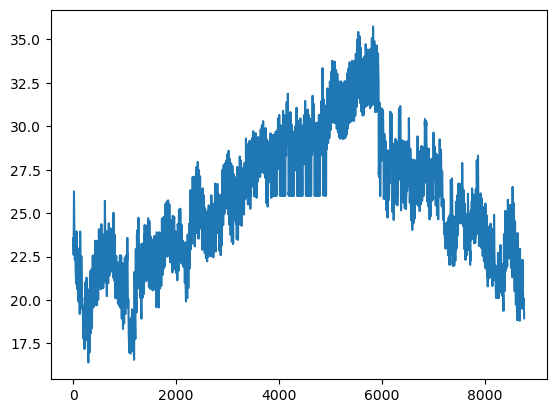

In [106]:
#try to plot the T_in_aver
plt.plot(output_data[:,0])

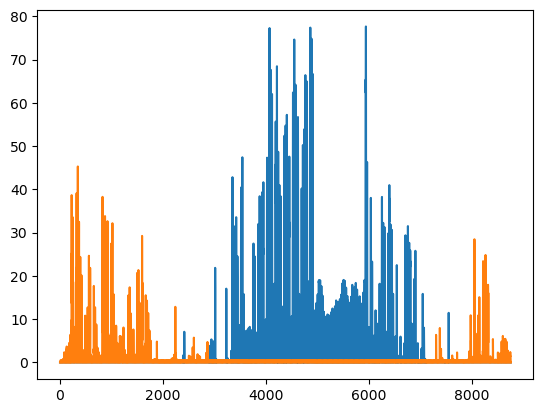

In [107]:
#plot the DistrictCooling and DistrictHeating
plt.plot(output_data[:,2])
plt.plot(output_data[:,3])

In [108]:
print(input_data.shape)
print(output_data.shape)   

(8760, 4)
(8760, 4)


In [109]:
#set the different periods of the data according to the seasonal data
inputdata_winter =  input_data[0:24*90,:]
inputdata_spring =  input_data[24*90:24*180,:]
inputdata_summer =  input_data[24*180:24*270,:]
inputdata_autumn =  input_data[24*270:,:]
print(inputdata_winter.shape, inputdata_spring.shape, inputdata_summer.shape, inputdata_autumn.shape)
outputdata_winter =  output_data[0:24*90,:]
outputdata_spring =  output_data[24*90:24*180,:]
outputdata_summer =  output_data[24*180:24*270,:]
outputdata_autumn =  output_data[24*270:,:]
print(outputdata_winter.shape, outputdata_spring.shape, outputdata_summer.shape, outputdata_autumn.shape)

(2160, 4) (2160, 4) (2160, 4) (2280, 4)
(2160, 4) (2160, 4) (2160, 4) (2280, 4)


In [110]:
def weather(season):
    if season == 'winter':
        inputdata = inputdata_winter
        outputdata = outputdata_winter
    elif season == 'spring':
        inputdata = inputdata_spring
        outputdata = outputdata_spring
    elif season == 'summer':
        inputdata = inputdata_summer
        outputdata = outputdata_summer
    elif season == 'autumn':
        inputdata = inputdata_autumn
        outputdata = outputdata_autumn
    else:
        print('Please input the correct season')
    return inputdata, outputdata

In [111]:
#set inputdata and outputdata
inputdata_winter, outputdata_winter = weather('winter')
inputdata_spring, outputdata_spring = weather('spring')
inputdata_summer, outputdata_summer = weather('summer')
inputdata_autumn, outputdata_autumn = weather('autumn')
print(inputdata_winter.shape, outputdata_winter.shape)
print(inputdata_spring.shape, outputdata_spring.shape)
print(inputdata_summer.shape, outputdata_summer.shape)
print(inputdata_autumn.shape, outputdata_autumn.shape)

(2160, 4) (2160, 4)
(2160, 4) (2160, 4)
(2160, 4) (2160, 4)
(2280, 4) (2280, 4)


In [112]:
#set the input and output data
#set the training data and testing data
#set the input data
train_rate = 0.7
data_len_winter = inputdata_winter.shape[0]
data_len_spring = inputdata_spring.shape[0]
data_len_summer = inputdata_summer.shape[0]
data_len_autumn = inputdata_autumn.shape[0]
# print(data_len)
# output data is the T_in_aver
inputdata_train_winter = inputdata_winter[0:int(data_len_winter*train_rate),:]
inputdata_train_spring = inputdata_spring[0:int(data_len_spring*train_rate),:]
inputdata_train_summer = inputdata_summer[0:int(data_len_summer*train_rate),:]
inputdata_train_autumn = inputdata_autumn[0:int(data_len_autumn*train_rate),:]

outputdata_train_winter = outputdata_winter[0:int(data_len_winter*train_rate),:][:,0]
outputdata_train_spring = outputdata_spring[0:int(data_len_spring*train_rate),:][:,0]
outputdata_train_summer = outputdata_summer[0:int(data_len_summer*train_rate),:][:,0]
outputdata_train_autumn = outputdata_autumn[0:int(data_len_autumn*train_rate),:][:,0]

x_train_winter = torch.from_numpy(inputdata_train_winter).float()
x_train_spring = torch.from_numpy(inputdata_train_spring).float()
x_train_summer = torch.from_numpy(inputdata_train_summer).float()
x_train_autumn = torch.from_numpy(inputdata_train_autumn).float()

y_train_winter = torch.from_numpy(outputdata_train_winter).float()
y_train_spring = torch.from_numpy(outputdata_train_spring).float()
y_train_summer = torch.from_numpy(outputdata_train_summer).float()
y_train_autumn = torch.from_numpy(outputdata_train_autumn).float()

#set the testing data:int(data_len*train_rate):int(data_len*train_rate)+168
inputdata_test_winter = inputdata_winter[int(data_len_winter*train_rate):int(data_len_winter*train_rate)+168,:]
inputdata_test_spring = inputdata_spring[int(data_len_spring*train_rate):int(data_len_spring*train_rate)+168,:]
inputdata_test_summer = inputdata_summer[int(data_len_summer*train_rate):int(data_len_summer*train_rate)+168,:]
inputdata_test_autumn = inputdata_autumn[int(data_len_autumn*train_rate):int(data_len_autumn*train_rate)+168,:]

outputdata_test_winter = outputdata_winter[int(data_len_winter*train_rate):int(data_len_winter*train_rate)+168,:][:,0] 
outputdata_test_spring = outputdata_spring[int(data_len_spring*train_rate):int(data_len_spring*train_rate)+168,:][:,0]
outputdata_test_summer = outputdata_summer[int(data_len_summer*train_rate):int(data_len_summer*train_rate)+168,:][:,0]
outputdata_test_autumn = outputdata_autumn[int(data_len_autumn*train_rate):int(data_len_autumn*train_rate)+168,:][:,0]

# print(outputdata_test[:,0])
x_test_winter = torch.from_numpy(inputdata_test_winter).float()
x_test_spring = torch.from_numpy(inputdata_test_spring).float()
x_test_summer = torch.from_numpy(inputdata_test_summer).float()
x_test_autumn = torch.from_numpy(inputdata_test_autumn).float()

y_test_winter = torch.from_numpy(outputdata_test_winter).float()
y_test_spring = torch.from_numpy(outputdata_test_spring).float()
y_test_summer = torch.from_numpy(outputdata_test_summer).float()
y_test_autumn = torch.from_numpy(outputdata_test_autumn).float()

In [113]:
#set the input and output size
input_size = inputdata_train_winter.shape[1]


train_size_winter = x_train_winter.size(0)
train_size_spring = x_train_spring.size(0)
train_size_summer = x_train_summer.size(0)
train_size_autumn = x_train_autumn.size(0)

test_size = x_test_winter.size(0)


train_size_winter, train_size_spring, train_size_summer, train_size_autumn
# test_size_winter

(1512, 1512, 1512, 1596)

In [114]:
hidden_size=20
batch_size=1
final_output_size = 1
output_size = 1
num_layers = 2                            # Number of LSTM layers
learning_rate = 0.01                      # Learning rate for the optimizer
num_epochs = 30    

In [115]:
# Define the LSTM model
class LSTM(nn.Module):                    # Define a custom LSTM class that inherits from PyTorch's nn.Module class
    def __init__(self, input_size, hidden_size, output_size, num_layers):
        super(LSTM, self).__init__()      # Call the constructor of the parent class
        self.hidden_size = hidden_size    # Set the hidden size
        self.num_layers = num_layers      # Set the number of layers
        self.lstm = nn.LSTM(input_size, hidden_size, num_layers, batch_first=True)  # Create an LSTM layer with the specified inputs
        self.fc = nn.Linear(hidden_size, output_size)                       # Create a fully connected output layer

    def forward(self, x):                 # Define the forward pass function for the model
        h0 = torch.zeros(self.num_layers, 1, self.hidden_size).requires_grad_()       # Initialize the hidden state to zeros
        c0 = torch.zeros(self.num_layers, 1, self.hidden_size).requires_grad_()       # Initialize the cell state to zeros
        out, (hn, cn) = self.lstm(x, (h0.detach(), c0.detach()))                              # Pass the input data and the initial hidden/cell state through the LSTM layer
        out = self.fc(out[:, -1, :])                                                         # Get the output at the final time step using the fully connected output layer
        return out

In [116]:
# Create the LSTM model
model = LSTM(input_size, hidden_size, output_size, num_layers)

# Define the loss function and optimizer
criterion = nn.MSELoss()                                      # Define Mean Squared Error as the loss function
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)  # Define Adam optimizer with the given learning rate


In [117]:
def choosetheweather(weather):
    if weather == 'winter':
        x_train = x_train_winter
        x_test = x_test_winter
        y_train = y_train_winter
        y_test = y_test_winter
        train_size = train_size_winter
    elif weather == 'spring':
        x_train = x_train_spring
        x_test = x_test_spring
        y_train = y_train_spring
        y_test = y_test_spring
        train_size = train_size_spring
    elif weather == 'summer':
        x_train = x_train_summer
        x_test = x_test_summer
        y_train = y_train_summer
        y_test = y_test_summer
        train_size = train_size_summer
    elif weather == 'autumn':
        x_train = x_train_autumn
        x_test = x_test_autumn
        y_train = y_train_autumn
        y_test = y_test_autumn
        train_size = train_size_autumn
    return x_train, x_test, y_train, y_test, train_size
    
        

loss: tensor(555.8149, grad_fn=<MseLossBackward0>)
loss: tensor(547.0436, grad_fn=<MseLossBackward0>)
loss: tensor(535.6375, grad_fn=<MseLossBackward0>)
loss: tensor(524.8435, grad_fn=<MseLossBackward0>)
loss: tensor(514.2797, grad_fn=<MseLossBackward0>)
loss: tensor(503.6510, grad_fn=<MseLossBackward0>)
loss: tensor(492.7757, grad_fn=<MseLossBackward0>)
loss: tensor(485.4504, grad_fn=<MseLossBackward0>)
loss: tensor(496.4515, grad_fn=<MseLossBackward0>)
loss: tensor(526.1116, grad_fn=<MseLossBackward0>)
loss: tensor(541.7292, grad_fn=<MseLossBackward0>)
loss: tensor(568.2030, grad_fn=<MseLossBackward0>)
loss: tensor(589.5944, grad_fn=<MseLossBackward0>)
loss: tensor(604.3597, grad_fn=<MseLossBackward0>)
loss: tensor(596.0587, grad_fn=<MseLossBackward0>)
loss: tensor(578.6756, grad_fn=<MseLossBackward0>)
loss: tensor(552.9576, grad_fn=<MseLossBackward0>)
loss: tensor(518.5705, grad_fn=<MseLossBackward0>)
loss: tensor(494.7815, grad_fn=<MseLossBackward0>)
loss: tensor(473.2601, grad_fn=

/Users/dtjgp/miniconda3/envs/ds/lib/python3.8/site-packages/torch/nn/modules/loss.py:536: UserWarning: Using a target size (torch.Size([1])) that is different to the input size (torch.Size([1, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


loss: tensor(276.8700, grad_fn=<MseLossBackward0>)
loss: tensor(277.2677, grad_fn=<MseLossBackward0>)
loss: tensor(263.6910, grad_fn=<MseLossBackward0>)
loss: tensor(257.1974, grad_fn=<MseLossBackward0>)
loss: tensor(253.0231, grad_fn=<MseLossBackward0>)
loss: tensor(255.3393, grad_fn=<MseLossBackward0>)
loss: tensor(245.6679, grad_fn=<MseLossBackward0>)
loss: tensor(231.4824, grad_fn=<MseLossBackward0>)
loss: tensor(217.7804, grad_fn=<MseLossBackward0>)
loss: tensor(205.0514, grad_fn=<MseLossBackward0>)
loss: tensor(195.3521, grad_fn=<MseLossBackward0>)
loss: tensor(186.9168, grad_fn=<MseLossBackward0>)
loss: tensor(178.0503, grad_fn=<MseLossBackward0>)
loss: tensor(169.6021, grad_fn=<MseLossBackward0>)
loss: tensor(161.2488, grad_fn=<MseLossBackward0>)
loss: tensor(154.3859, grad_fn=<MseLossBackward0>)
loss: tensor(147.1897, grad_fn=<MseLossBackward0>)
loss: tensor(140.4780, grad_fn=<MseLossBackward0>)
loss: tensor(134.0867, grad_fn=<MseLossBackward0>)
loss: tensor(127.9478, grad_fn=

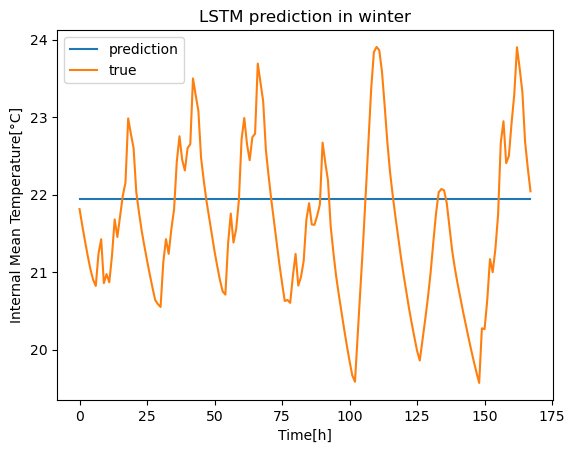

mse:1.142859935760498


In [118]:
# Train the model in winter
x_train, x_test, y_train, y_test, train_size = choosetheweather('winter')
for epoch in range(num_epochs):

    
    # Forward pass
    for i in range(0, train_size, 1):
        seq = x_train[i:i+batch_size]                   # Get the input sequence
        seq = seq.view(1, 1, input_size)                # Reshape the input data to the required shape
        y_train_pred = model(seq)                             # Predict output values for the training data
        loss = criterion(y_train_pred, y_train[i:i+batch_size])                   # Calculate the loss between predicted and actual values

        # Backward and optimize
        optimizer.zero_grad()                                     # Clear the gradients
        loss.backward()                                           # Compute gradients
        optimizer.step()                                          # Apply gradients

        print('loss:',loss)
    print('Epoch [{}/{}], Loss: {:.4f}'.format(epoch, num_epochs, loss.item()))
    
y_pred = []
for i in range(test_size):
    seq = x_test[i:i+batch_size]
    seq = seq.view(1, 1, input_size)
    # y_test = torch.FloatTensor(y_train[i + 1].reshape(-1))
    y_hat = model(seq)

    y_pred.append((y_hat.view(-1)).detach().numpy())
    
y_pred = np.array(y_pred)
y_pred = y_pred.reshape(-1)
plt.figure()
plt.plot(y_pred, label='prediction')
plt.plot(y_test, label='true')
plt.xlabel('Time[h]')
plt.ylabel('Internal Mean Temperature[°C]')
plt.legend()
plt.title('LSTM prediction in winter')
plt.show()
print(f'mse:{mse(y_test, y_pred)}')

loss: tensor(0.0097, grad_fn=<MseLossBackward0>)
loss: tensor(0.0159, grad_fn=<MseLossBackward0>)
loss: tensor(0.1250, grad_fn=<MseLossBackward0>)
loss: tensor(0.3284, grad_fn=<MseLossBackward0>)
loss: tensor(0.6145, grad_fn=<MseLossBackward0>)
loss: tensor(0.8342, grad_fn=<MseLossBackward0>)
loss: tensor(1.0847, grad_fn=<MseLossBackward0>)
loss: tensor(1.2633, grad_fn=<MseLossBackward0>)
loss: tensor(0.9363, grad_fn=<MseLossBackward0>)
loss: tensor(0.8860, grad_fn=<MseLossBackward0>)
loss: tensor(0.5017, grad_fn=<MseLossBackward0>)
loss: tensor(0.2075, grad_fn=<MseLossBackward0>)
loss: tensor(0.0007, grad_fn=<MseLossBackward0>)
loss: tensor(0.0001, grad_fn=<MseLossBackward0>)
loss: tensor(0.0392, grad_fn=<MseLossBackward0>)
loss: tensor(0.0746, grad_fn=<MseLossBackward0>)
loss: tensor(0.0338, grad_fn=<MseLossBackward0>)
loss: tensor(6.2414e-05, grad_fn=<MseLossBackward0>)
loss: tensor(0.0365, grad_fn=<MseLossBackward0>)
loss: tensor(0.1247, grad_fn=<MseLossBackward0>)
loss: tensor(0.2

/Users/dtjgp/miniconda3/envs/ds/lib/python3.8/site-packages/torch/nn/modules/loss.py:536: UserWarning: Using a target size (torch.Size([1])) that is different to the input size (torch.Size([1, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


loss: tensor(0.4877, grad_fn=<MseLossBackward0>)
loss: tensor(0.1745, grad_fn=<MseLossBackward0>)
loss: tensor(0.0220, grad_fn=<MseLossBackward0>)
loss: tensor(0.0077, grad_fn=<MseLossBackward0>)
loss: tensor(0.0971, grad_fn=<MseLossBackward0>)
loss: tensor(0.2598, grad_fn=<MseLossBackward0>)
loss: tensor(0.4738, grad_fn=<MseLossBackward0>)
loss: tensor(0.7127, grad_fn=<MseLossBackward0>)
loss: tensor(0.0105, grad_fn=<MseLossBackward0>)
loss: tensor(0.4141, grad_fn=<MseLossBackward0>)
loss: tensor(1.6952, grad_fn=<MseLossBackward0>)
loss: tensor(0.7465, grad_fn=<MseLossBackward0>)
loss: tensor(0.0724, grad_fn=<MseLossBackward0>)
loss: tensor(0.2518, grad_fn=<MseLossBackward0>)
loss: tensor(0.6372, grad_fn=<MseLossBackward0>)
loss: tensor(0.6734, grad_fn=<MseLossBackward0>)
loss: tensor(0.8413, grad_fn=<MseLossBackward0>)
loss: tensor(0.8614, grad_fn=<MseLossBackward0>)
loss: tensor(1.2087, grad_fn=<MseLossBackward0>)
loss: tensor(4.8185, grad_fn=<MseLossBackward0>)
loss: tensor(6.0958,

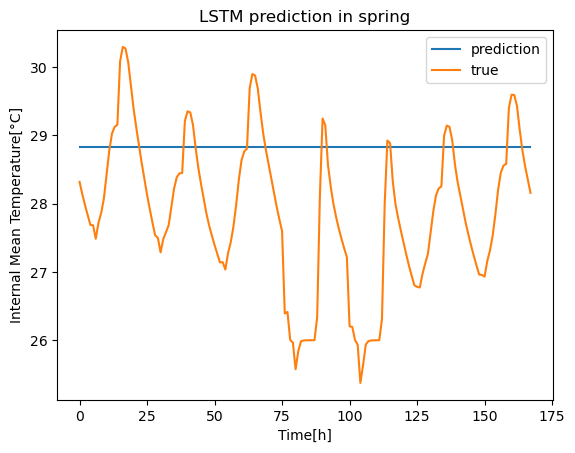

mse:2.1491575241088867


In [119]:
# Train the model in spring
x_train, x_test, y_train, y_test, train_size = choosetheweather('spring')
for epoch in range(40):

    
    # Forward pass
    for i in range(0, train_size, 1):
        seq = x_train[i:i+batch_size]                   # Get the input sequence
        seq = seq.view(1, 1, input_size)                # Reshape the input data to the required shape
        y_train_pred = model(seq)                             # Predict output values for the training data
        loss = criterion(y_train_pred, y_train[i:i+batch_size])                   # Calculate the loss between predicted and actual values

        # Backward and optimize
        optimizer.zero_grad()                                     # Clear the gradients
        loss.backward()                                           # Compute gradients
        optimizer.step()                                          # Apply gradients

        print('loss:',loss)
    print('Epoch [{}/{}], Loss: {:.4f}'.format(epoch, num_epochs, loss.item()))
    
y_pred = []
for i in range(test_size):
    seq = x_test[i:i+batch_size]
    seq = seq.view(1, 1, input_size)
    # y_test = torch.FloatTensor(y_train[i + 1].reshape(-1))
    y_hat = model(seq)

    y_pred.append((y_hat.view(-1)).detach().numpy())
    
y_pred = np.array(y_pred)
y_pred = y_pred.reshape(-1)
plt.figure()
plt.plot(y_pred, label='prediction')
plt.plot(y_test, label='true')
plt.xlabel('Time[h]')
plt.ylabel('Internal Mean Temperature[°C]')
plt.legend()
plt.title('LSTM prediction in spring')
plt.show()
print(f'mse:{mse(y_test, y_pred)}')

loss: tensor(0.0237, grad_fn=<MseLossBackward0>)
loss: tensor(0.0813, grad_fn=<MseLossBackward0>)
loss: tensor(0.1697, grad_fn=<MseLossBackward0>)
loss: tensor(0.2707, grad_fn=<MseLossBackward0>)
loss: tensor(0.3736, grad_fn=<MseLossBackward0>)
loss: tensor(0.3623, grad_fn=<MseLossBackward0>)
loss: tensor(0.9799, grad_fn=<MseLossBackward0>)
loss: tensor(0.5644, grad_fn=<MseLossBackward0>)
loss: tensor(0.2645, grad_fn=<MseLossBackward0>)
loss: tensor(0.0483, grad_fn=<MseLossBackward0>)
loss: tensor(0.0514, grad_fn=<MseLossBackward0>)
loss: tensor(0.3816, grad_fn=<MseLossBackward0>)
loss: tensor(0.7205, grad_fn=<MseLossBackward0>)
loss: tensor(0.9718, grad_fn=<MseLossBackward0>)
loss: tensor(1.1222, grad_fn=<MseLossBackward0>)
loss: tensor(4.0449, grad_fn=<MseLossBackward0>)
loss: tensor(4.4837, grad_fn=<MseLossBackward0>)
loss: tensor(4.0526, grad_fn=<MseLossBackward0>)
loss: tensor(2.8970, grad_fn=<MseLossBackward0>)
loss: tensor(1.7245, grad_fn=<MseLossBackward0>)
loss: tensor(0.9313,

/Users/dtjgp/miniconda3/envs/ds/lib/python3.8/site-packages/torch/nn/modules/loss.py:536: UserWarning: Using a target size (torch.Size([1])) that is different to the input size (torch.Size([1, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


loss: tensor(2.6246, grad_fn=<MseLossBackward0>)
loss: tensor(3.0147, grad_fn=<MseLossBackward0>)
loss: tensor(4.5321, grad_fn=<MseLossBackward0>)
loss: tensor(4.6635, grad_fn=<MseLossBackward0>)
loss: tensor(4.6258, grad_fn=<MseLossBackward0>)
loss: tensor(4.4871, grad_fn=<MseLossBackward0>)
loss: tensor(4.2636, grad_fn=<MseLossBackward0>)
loss: tensor(3.9728, grad_fn=<MseLossBackward0>)
loss: tensor(3.6327, grad_fn=<MseLossBackward0>)
loss: tensor(3.2607, grad_fn=<MseLossBackward0>)
loss: tensor(2.8728, grad_fn=<MseLossBackward0>)
loss: tensor(2.4835, grad_fn=<MseLossBackward0>)
loss: tensor(1.1628, grad_fn=<MseLossBackward0>)
loss: tensor(2.0116, grad_fn=<MseLossBackward0>)
loss: tensor(9.4209, grad_fn=<MseLossBackward0>)
loss: tensor(10.3460, grad_fn=<MseLossBackward0>)
loss: tensor(7.3144, grad_fn=<MseLossBackward0>)
loss: tensor(5.5234, grad_fn=<MseLossBackward0>)
loss: tensor(4.5856, grad_fn=<MseLossBackward0>)
loss: tensor(3.6504, grad_fn=<MseLossBackward0>)
loss: tensor(2.8558

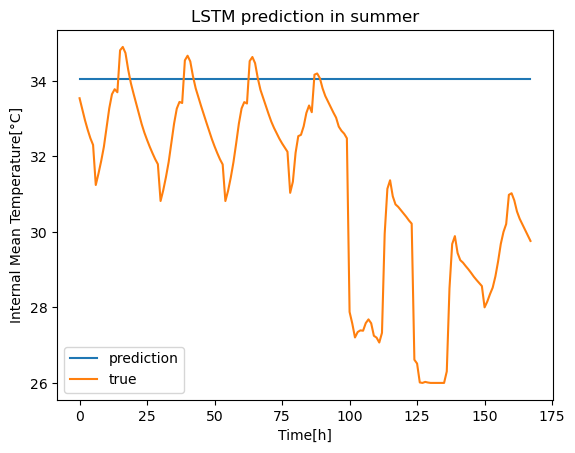

mse:14.418837547302246


In [120]:
# Train the model in summer
x_train, x_test, y_train, y_test, train_size = choosetheweather('summer')
for epoch in range(50):

    
    # Forward pass
    for i in range(0, train_size, 1):
        seq = x_train[i:i+batch_size]                   # Get the input sequence
        seq = seq.view(1, 1, input_size)                # Reshape the input data to the required shape
        y_train_pred = model(seq)                             # Predict output values for the training data
        loss = criterion(y_train_pred, y_train[i:i+batch_size])                   # Calculate the loss between predicted and actual values

        # Backward and optimize
        optimizer.zero_grad()                                     # Clear the gradients
        loss.backward()                                           # Compute gradients
        optimizer.step()                                          # Apply gradients

        print('loss:',loss)
    print('Epoch [{}/{}], Loss: {:.4f}'.format(epoch, num_epochs, loss.item()))
    
y_pred = []
for i in range(test_size):
    seq = x_test[i:i+batch_size]
    seq = seq.view(1, 1, input_size)
    # y_test = torch.FloatTensor(y_train[i + 1].reshape(-1))
    y_hat = model(seq)

    y_pred.append((y_hat.view(-1)).detach().numpy())
    
y_pred = np.array(y_pred)
y_pred = y_pred.reshape(-1)
plt.figure()
plt.plot(y_pred, label='prediction')
plt.plot(y_test, label='true')
plt.xlabel('Time[h]')
plt.ylabel('Internal Mean Temperature[°C]')
plt.legend()
plt.title('LSTM prediction in summer')
plt.show()
print(f'mse:{mse(y_test, y_pred)}')

In [121]:
# Train the model in autumn
x_train, x_test, y_train, y_test, train_size = choosetheweather('autumn')
for epoch in range(num_epochs):

    
    # Forward pass
    for i in range(0, train_size, 1):
        seq = x_train[i:i+batch_size]                   # Get the input sequence
        seq = seq.view(1, 1, input_size)                # Reshape the input data to the required shape
        y_train_pred = model(seq)                             # Predict output values for the training data
        loss = criterion(y_train_pred, y_train[i:i+batch_size])                   # Calculate the loss between predicted and actual values

        # Backward and optimize
        optimizer.zero_grad()                                     # Clear the gradients
        loss.backward()                                           # Compute gradients
        optimizer.step()                                          # Apply gradients

        print('loss:',loss)
    print('Epoch [{}/{}], Loss: {:.4f}'.format(epoch, num_epochs, loss.item()))
    
y_pred = []
for i in range(test_size):
    seq = x_test[i:i+batch_size]
    seq = seq.view(1, 1, input_size)
    # y_test = torch.FloatTensor(y_train[i + 1].reshape(-1))
    y_hat = model(seq)

    y_pred.append((y_hat.view(-1)).detach().numpy())
    
y_pred = np.array(y_pred)
y_pred = y_pred.reshape(-1)
plt.figure()
plt.plot(y_pred, label='prediction')
plt.plot(y_test, label='true')
plt.xlabel('Time[h]')
plt.ylabel('Internal Mean Temperature[°C]')
plt.legend()
plt.title('LSTM prediction in autumn')
plt.show()
print(f'mse:{mse(y_test, y_pred)}')

loss: tensor(45.9130, grad_fn=<MseLossBackward0>)
loss: tensor(48.2527, grad_fn=<MseLossBackward0>)
loss: tensor(49.5465, grad_fn=<MseLossBackward0>)
loss: tensor(49.5285, grad_fn=<MseLossBackward0>)
loss: tensor(48.7732, grad_fn=<MseLossBackward0>)
loss: tensor(47.0960, grad_fn=<MseLossBackward0>)
loss: tensor(44.8199, grad_fn=<MseLossBackward0>)
loss: tensor(38.0111, grad_fn=<MseLossBackward0>)
loss: tensor(33.4851, grad_fn=<MseLossBackward0>)
loss: tensor(25.9789, grad_fn=<MseLossBackward0>)
loss: tensor(16.0466, grad_fn=<MseLossBackward0>)
loss: tensor(8.4905, grad_fn=<MseLossBackward0>)
loss: tensor(3.8896, grad_fn=<MseLossBackward0>)
loss: tensor(1.8970, grad_fn=<MseLossBackward0>)
loss: tensor(1.0346, grad_fn=<MseLossBackward0>)
loss: tensor(0.1303, grad_fn=<MseLossBackward0>)
loss: tensor(0.0702, grad_fn=<MseLossBackward0>)
loss: tensor(0.0634, grad_fn=<MseLossBackward0>)
loss: tensor(0.1292, grad_fn=<MseLossBackward0>)
loss: tensor(0.1256, grad_fn=<MseLossBackward0>)
loss: ten

/Users/dtjgp/miniconda3/envs/ds/lib/python3.8/site-packages/torch/nn/modules/loss.py:536: UserWarning: Using a target size (torch.Size([1])) that is different to the input size (torch.Size([1, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


tensor(0.0070, grad_fn=<MseLossBackward0>)
loss: tensor(0.6459, grad_fn=<MseLossBackward0>)
loss: tensor(0.6682, grad_fn=<MseLossBackward0>)
loss: tensor(0.8421, grad_fn=<MseLossBackward0>)
loss: tensor(1.0266, grad_fn=<MseLossBackward0>)
loss: tensor(1.5465, grad_fn=<MseLossBackward0>)
loss: tensor(0.6790, grad_fn=<MseLossBackward0>)
loss: tensor(0.5263, grad_fn=<MseLossBackward0>)
loss: tensor(0.4853, grad_fn=<MseLossBackward0>)
loss: tensor(0.4428, grad_fn=<MseLossBackward0>)
loss: tensor(0.3973, grad_fn=<MseLossBackward0>)
loss: tensor(0.3502, grad_fn=<MseLossBackward0>)
loss: tensor(0.3032, grad_fn=<MseLossBackward0>)
loss: tensor(0.1035, grad_fn=<MseLossBackward0>)
loss: tensor(2.5153, grad_fn=<MseLossBackward0>)
loss: tensor(5.6793, grad_fn=<MseLossBackward0>)
loss: tensor(5.8218, grad_fn=<MseLossBackward0>)
loss: tensor(3.5390, grad_fn=<MseLossBackward0>)
loss: tensor(2.4641, grad_fn=<MseLossBackward0>)
loss: tensor(1.8047, grad_fn=<MseLossBackward0>)
loss: tensor(1.3290, grad_

KeyboardInterrupt: 